In [ ]:
ls.str()

In [1]:
library(Seurat)
suppressPackageStartupMessages(library(tidyverse))
suppressPackageStartupMessages(library(data.table))
library(patchwork)
library(DoubletFinder)

Attaching SeuratObject



In [2]:
library(future)
library(future.apply)
plan("multicore", workers = 16) 
options(future.globals.maxSize = 200 * 1024^3)

# 数据整合

In [3]:
rawdir <- paste0(getwd(), '/data/')
tmpdir <- paste0(getwd(), '/tmp/')

In [ ]:
samples <- list.files(rawdir)
samples

In [ ]:
## 批量导入数据，识别Doublet
starttime <- Sys.time()
slist <- future_lapply(samples, function(i){
  idir <- file.path(rawdir, i)
  a <- fread(idir, data.table = F) %>% column_to_rownames('V1')
  idat <- CreateSeuratObject(counts = a, min.cells = 3, min.features = 500, project = strsplit(i,'[.]')[[1]][1])
  idat[["percent.mt"]] <- PercentageFeatureSet(idat, pattern = "^MT-")
  idat <- subset(idat, subset = nFeature_RNA > 200 & nFeature_RNA < 25000 & percent.mt < 25 & nCount_RNA > 1000 & nCount_RNA < 500000)
  
  idat@meta.data$orig.ident <- paste(strsplit((idat@project.name),"_")[[1]][c(4,5)], collapse = '_')
  idat@meta.data$Patient <- strsplit((idat@project.name),"_")[[1]][4]
  idat@meta.data$Source <- strsplit((idat@project.name),"_")[[1]][5]
  idat@meta.data$barcode <- rownames(idat@meta.data)
  
  idat <- NormalizeData(idat, verbose = F)
  idat <- ScaleData(idat, vars.to.regress = c("percent.mt"), verbose = F)
  idat <- FindVariableFeatures(idat, selection.method = "vst", nfeatures = 2000, verbose = F)
  idat <- RunPCA(idat, features = VariableFeatures(idat), verbose = F)
  
  pc.num = 1:20
  idat <- FindNeighbors(idat, dims = pc.num, verbose = F)
  idat <- FindClusters(idat, resolution = 0.5, verbose = F)
  idat <- RunTSNE(idat, dims = pc.num, reduction = "pca")
  # idat <- RunUMAP(idat, dims = pc.num, verbose = F)
  
  # 寻找最优pK值
  idat_db <- idat  # 用新变量跑DoubletFinder
  sweep.res.list_idat <- paramSweep_v3(idat_db, PCs = pc.num, sct = FALSE, num.cores = 10)
  sweep.stats_idat<- summarizeSweep(sweep.res.list_idat, GT = F)
  bcmvn_idat <- find.pK(sweep.stats_idat)
  pK_bcmvn <- bcmvn_idat$pK[which.max(bcmvn_idat$BCmetric)] %>% as.character() %>% as.numeric()
  
  # 排除不能检出的同源doublets，优化期望的doublets数量
  DoubletRate = 0.05    # 5000细胞对应的doublets rate是3.9%，见https://cloud.tencent.com/developer/article/1825672
  homotypic.prop <- modelHomotypic(idat_db@meta.data$seurat_clusters)   # 最好提供celltype（注释之后的？）
  nExp_poi <- round(DoubletRate*ncol(idat_db))
  nExp_poi.adj <- round(nExp_poi*(1-homotypic.prop))
  
  idat_db <- doubletFinder_v3(idat_db, PCs = pc.num, pN = 0.25, pK = pK_bcmvn, nExp = nExp_poi.adj, reuse.pANN = F, sct = F)
  colnames(idat_db@meta.data)[grep('^DF',colnames(idat_db@meta.data))] <- "DF"
  
  idat$doublets <- idat_db$DF
  idat
})
endtime <- Sys.time()

In [ ]:
endtime-starttime

In [ ]:
## 保存slist
saveRDS(slist, file = paste0(tmpdir, 'slist_std_DF.Rds'))

In [ ]:
slist <- readRDS(paste0(tmpdir, 'slist_std_DF.Rds'))

In [ ]:
## 删除doublet
for (i in 1:length(slist)){
  slist[[i]] <- subset(slist[[i]], doublets == "Singlet")
}

In [ ]:
## 数据集整合（RPCA）
slist <- future_lapply(slist, function(x){
  x <- NormalizeData(x)
  x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 2000)
})
features <- SelectIntegrationFeatures(slist)
slist <- lapply(slist, function(x){
  x <- ScaleData(x, features = features, verbose = F)
  x <- RunPCA(x, features = features, verbose = F)
})
anchors <- FindIntegrationAnchors(slist, dims = 1:20, reduction = "rpca", verbose = F)
sce <- IntegrateData(anchors, dims = 1:20, new.assay.name = "RPCA", verbose = F)

# 初步分群

In [ ]:
DefaultAssay(sce) <- "RPCA"
sce <- ScaleData(sce, verbose = F)
sce <- RunPCA(sce, npcs = 50, verbose = F)
sce <- RunUMAP(sce, reduction = "pca", dims = 1:20)
sce <- FindNeighbors(sce, reduction = "pca", dims = 1:20, min_dist=0.1)
sce <- FindClusters(sce, resolution = 1)

In [ ]:
## 保存sce
saveRDS(sce, file = paste0(tmpdir, 'sce_std_rpca.Rds'))

In [ ]:
DefaultAssay(sce) <- "RNA"
options(repr.plot.width=6, repr.plot.height=6)
DimPlot(sce, group.by = 'Source')

In [ ]:
## 手动亚群注释
genes_to_check <- c('PTPRC', 'CD3D', 'CD4',  # CD4+T cells
                    'PTPRC', 'CD3D', 'CD8A',  # CD8+T cells
                    'CD19', 'MS4A1',  # B cells
                    'FCGR3A', 'NCAM1',  # NK cells
                    'CD14', 'ITGAX',  # myeloid
                    'EPCAM', 'KRT5'  # malignant
                   )
options(repr.plot.width=12, repr.plot.height=8)
DotPlot(sce, features = unique(genes_to_check)) + coord_flip()

In [ ]:
cluster2celltype <- data.frame(cluster=levels(sce@meta.data$seurat_clusters), celltype='unknown')
cluster2celltype[cluster2celltype$cluster %in% c(0,1,10,11,12,14,16,17,19,23),2] <- 'CD8+T'
cluster2celltype[cluster2celltype$cluster %in% c(3:5,8,11,18),2] <- 'CD4+T'
cluster2celltype[cluster2celltype$cluster %in% c(7,20),2] <- 'NK'
cluster2celltype[cluster2celltype$cluster %in% c(2),2] <- 'NKT'
cluster2celltype[cluster2celltype$cluster %in% c(6,9,21,26),2] <- 'Bcell'
cluster2celltype[cluster2celltype$cluster %in% c(13,18),2] <- 'Myeloid'
cluster2celltype[cluster2celltype$cluster %in% c(15,27),2] <- 'Malignant'
cluster2celltype

In [9]:
sce@meta.data$celltype <- cluster2celltype$celltype[match(sce@meta.data$seurat_clusters, cluster2celltype$cluster)]
head(sce@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,Patient,Source,barcode,RNA_snn_res.0.5,seurat_clusters,doublets,RPCA_snn_res.1,celltype
,<chr>,<dbl>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<fct>,<chr>,<fct>,<chr>
npc_1802_pbmc_ACGAGGACAAGCCGTC,1802_PBMC,1291,885,3.950426,1802,PBMC,npc_1802_pbmc_ACGAGGACAAGCCGTC,14,17,Singlet,17,CD8+T
npc_1802_pbmc_ACTATCTAGTCCATAC,1802_PBMC,1618,951,9.270705,1802,PBMC,npc_1802_pbmc_ACTATCTAGTCCATAC,14,17,Singlet,17,CD8+T
npc_1802_pbmc_AGCGTCGAGAAGATTC,1802_PBMC,1399,934,6.290207,1802,PBMC,npc_1802_pbmc_AGCGTCGAGAAGATTC,14,17,Singlet,17,CD8+T
npc_1802_pbmc_AGCTTGACAAACCTAC,1802_PBMC,1486,981,7.806191,1802,PBMC,npc_1802_pbmc_AGCTTGACAAACCTAC,14,17,Singlet,17,CD8+T
npc_1802_pbmc_CAAGTTGAGAGGTACC,1802_PBMC,2423,1548,4.250929,1802,PBMC,npc_1802_pbmc_CAAGTTGAGAGGTACC,6,7,Singlet,7,NK
npc_1802_pbmc_CACTCCAAGAGACTTA,1802_PBMC,2174,1214,14.397424,1802,PBMC,npc_1802_pbmc_CACTCCAAGAGACTTA,14,17,Singlet,17,CD8+T


In [ ]:
options(repr.plot.width=6, repr.plot.height=6)
DimPlot(sce, group.by = 'celltype', label = T)

# 提取亚群

In [1]:
library(Seurat)
suppressPackageStartupMessages(library(tidyverse))
suppressPackageStartupMessages(library(data.table))

rawdir <- paste0(getwd(), '/data/')
tmpdir <- paste0(getwd(), '/tmp/')
#sce <- readRDS(paste0(tmpdir, 'sce_std_rpca.Rds'))

Attaching SeuratObject



In [10]:
sce_TNK <- subset(sce, celltype %in% c('CD8+T','CD4+T','NK','NKT'))
sce_TNK

An object of class Seurat 
22831 features across 138031 samples within 2 assays 
Active assay: RPCA (2000 features, 2000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [ ]:
DefaultAssay(sce_TNK) <- "RNA"
sce_TNK <- sce_TNK %>% 
NormalizeData(verbose = F) %>% 
ScaleData(vars.to.regress = c("percent.mt"), verbose = F) %>% 
FindVariableFeatures(selection.method = "vst", nfeatures = 2000, verbose = F) %>% 
RunPCA(verbose = F) %>% 
FindNeighbors(dims = 1:20, verbose = F) %>% 
FindClusters(resolution = 1, verbose = F) %>% 
RunUMAP(dims = 1:20, reduction = "pca")

In [ ]:
p1 <- DimPlot(sce_TNK, label = T)
p2 <- DimPlot(sce_TNK, group.by = 'celltype', label = T)
options(repr.plot.width=12, repr.plot.height=6)
p1+p2

In [25]:
all.markers <- FindAllMarkers(sce_TNK, only.pos = TRUE, min.pct = 0.1, logfc.threshold = 0.25, verbose = F)

In [ ]:
all.markers %>% group_by(cluster) %>% slice_max(n = 10, order_by = avg_log2FC)

In [ ]:
# 寻找亚群marker并重命名


In [66]:
## StackedVlnPlot函数
modify_vlnplot <- function(obj, feature, pt.size = 0, plot.margin = unit(c(-0.75, 0, -0.75, 0), "cm"),...) {
       p <- VlnPlot(obj, features = feature, pt.size = pt.size, ... ) +
               xlab("") + ylab(feature) + ggtitle("") +
               theme(legend.position = "none",
               axis.text.x = element_blank(),
               axis.text.y = element_blank(),
               axis.ticks.x = element_blank(),
               axis.ticks.y = element_line(),
               axis.title.y = element_text(size = rel(1), angle = 0, vjust = 0.5),
               plot.margin = plot.margin)
       return(p)
}

## main function
StackedVlnPlot <- function(obj, features, pt.size = 0, plot.margin = unit(c(-0.75, 0, -0.75, 0), "cm"), ...) {
       plot_list <- purrr::map(features, function(x) modify_vlnplot(obj = obj,feature = x, ...))
       plot_list[[length(plot_list)]] <- plot_list[[length(plot_list)]] + theme(axis.text.x=element_text(), axis.ticks.x = element_line())
       p <- patchwork::wrap_plots(plotlist = plot_list, ncol = 1)
       return(p)
}

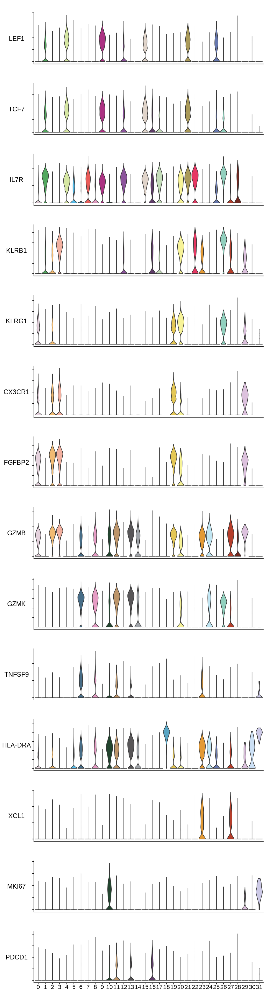

In [68]:
# 堆积小提琴图展示亚群marker
genes_to_check <- c('LEF1','TCF7','IL7R','KLRB1','KLRG1','CX3CR1','FGFBP2','GZMB','GZMK','TNFSF9','HLA-DRA','XCL1','MKI67','PDCD1')
my36colors <- c('#E5D2DD', '#53A85F', '#F1BB72', '#F3B1A0', '#D6E7A3', '#57C3F3', '#476D87', '#E95C59', '#E59CC4', 
                '#AB3282', '#23452F', '#BD956A', '#8C549C', '#585658', '#9FA3A8', '#E0D4CA', '#5F3D69', '#C5DEBA', 
                '#58A4C3', '#E4C755', '#F7F398', '#AA9A59', '#E63863', '#E39A35', '#C1E6F3', '#6778AE', '#91D0BE', 
                '#B53E2B', '#712820', '#DCC1DD', '#CCE0F5', '#CCC9E6', '#625D9E', '#68A180', '#3A6963', '#968175')
options(repr.plot.width=8, repr.plot.height=30)
StackedVlnPlot(sce_TNK, genes_to_check, pt.size=0, cols=my36colors, group.by = 'seurat_clusters')
#p1 <- StackedVlnPlot(sce_TNK, genes_to_check, pt.size=0, cols=my36colors, group.by = 'celltype')

In [169]:
# 添加基因注释（待完善）
gene_group <- data.frame(gene=genes_to_check, group=c(rep('a',4),rep('b',6,),rep('c',4)))
a <- gene_group %>% count(group)
a$yend <- cumsum(a$n)
a$ystart <- a$yend-a$n
a$label_position=a$ystart+(a$yend-a$ystart)/2

p2 <- ggplot(a,aes(x=1,y=ystart,color=group))+
  geom_segment(aes(xend=1,yend=yend),size=3)+
  scale_color_brewer(palette = "Set1")+
  scale_y_continuous(position = "left",
                     breaks = a$label_position,
                     labels = a$group,expand = c(0,0))+
  scale_x_continuous(expand = c(0,0))+
  facet_grid(group~.,scales = 'free')+
  theme(strip.text = element_blank(),
        strip.background = element_blank(),
        panel.background = element_blank(),
        panel.grid = element_blank(),
        axis.title = element_blank(),
        axis.text.x = element_blank(),
        axis.text.y = element_text(size=30),
        axis.ticks = element_blank(),
        legend.position = "none")

In [ ]:
options(repr.plot.width=6, repr.plot.height=15)
p2|p1

# 功能富集

In [13]:
# 导入基因集
signature <- read.csv('./info/Signature_score_related_genes.csv', fill = F)
sig_list <- lapply(1:ncol(signature), function(i) signature[,i][which(signature[,i]!='')])
names(sig_list) <- colnames(signature)
#sig_list

## AddModuleScore

In [14]:
# 计算功能模块得分
sce_TNK <- AddModuleScore(sce_TNK, features = sig_list, name = 'signature')
colnames(sce_TNK@meta.data)[grep('signature', colnames(sce_TNK@meta.data))] <- names(sig_list)

Warning message:
“The following features are not present in the object: CCNE149, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: CLEC4M, PSMB11, KIF4B, HLA-DRB3, HLA-DRB4, HLA-H, MARCHF1, SH3GL2, KIF2B, CAPZA3, AC027237.1, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: NGF, PPP3R2, PRKACG, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: AC005840.1, MIR155, MIR223, not searching for symbol synonyms”


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



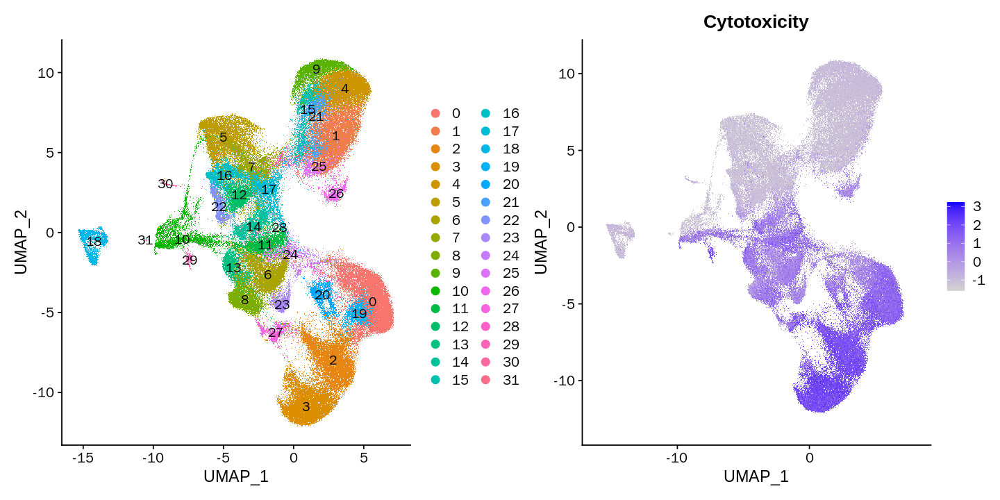

In [15]:
p1 <- DimPlot(sce_TNK,label = T)
p2 <- FeaturePlot(sce_TNK, features = names(sig_list)[2])
options(repr.plot.width=12, repr.plot.height=6)
p1+p2

In [16]:
saveRDS(sce_TNK, file = paste0(tmpdir, 'sce_TNK.Rds'))

In [4]:
sce_TNK <- readRDS(paste0(tmpdir, 'sce_TNK.Rds'))

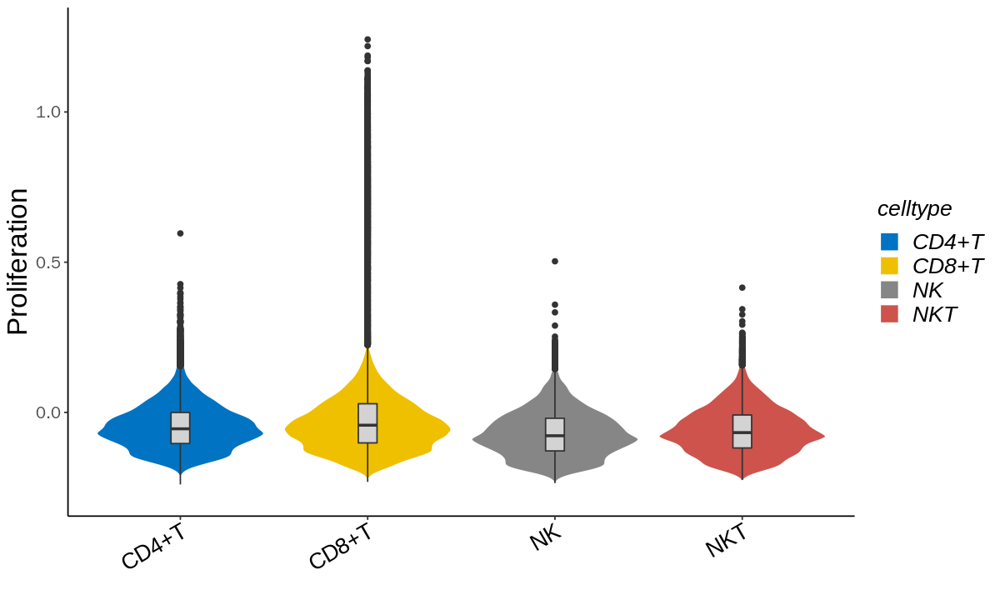

In [7]:
# 小提琴图展示各亚群得分
vlnplot_data <- sce_TNK@meta.data[,c('celltype', 'RNA_snn_res.1', names(sig_list))]
id <- 'celltype'
sig <- 'Proliferation'
ncolor <- length(unique(sce_TNK@meta.data[, id]))
#cols <- colorRampPalette(RColorBrewer::brewer.pal(n = 9, name="YlOrRd"))(ncolor)
cols <- ggsci::pal_jco()(ncolor)

options(repr.plot.width=10, repr.plot.height=6)
ggplot(vlnplot_data, aes_string(x=id, y=sig, fill=id)) + 
  geom_violin(trim=F, color="white", size = 1, scale = "width") +
  geom_boxplot(width=0.1, position=position_dodge(0.9), fill="lightgrey")+ 
  scale_fill_manual(values = cols)+ 
  theme_bw()+ 
  theme(axis.text.x=element_text(angle=30, hjust = 1, colour="black", size=16),
        axis.text.y=element_text(size=12, face="plain"), 
        axis.title.y=element_text(size = 20, face="plain"), 
        panel.border = element_blank(),axis.line = element_line(colour = "black",size=0.5), 
        legend.text=element_text(face="italic",  colour="black", size=16),
        legend.title=element_text(face="italic", colour="black", size=16),
        panel.grid.major = element_blank(),   
        panel.grid.minor = element_blank())+  
        ylab(sig)+xlab("")

## GSVA

# 拟时序

## Monocle2

In [3]:
suppressPackageStartupMessages(library(monocle))

In [4]:
sce_TNK <- readRDS(paste0(tmpdir, 'sce_TNK.Rds'))

In [5]:
##创建monocle的CDS对象

sce2cds <- subset(sce_TNK, seurat_clusters %in% c(1,4,9))

# 若数据太大，需要用as_matrix代替as.matrix函数
as_matrix <- function(mat){
  tmp <- matrix(data=0L, nrow = mat@Dim[1], ncol = mat@Dim[2])
  row_pos <- mat@i+1
  col_pos <- findInterval(seq(mat@x)-1,mat@p[-1])+1
  val <- mat@x 
  for (i in seq_along(val)){
      tmp[row_pos[i],col_pos[i]] <- val[i]
  } 
  row.names(tmp) <- mat@Dimnames[[1]]
  colnames(tmp) <- mat@Dimnames[[2]]
  return(tmp)
}

data <- as(as_matrix(sce2cds@assays$RNA@counts), 'sparseMatrix')
pd <- new('AnnotatedDataFrame', data = sce2cds@meta.data)
fData <- data.frame(gene_short_name = row.names(data), row.names = row.names(data))
fd <- new('AnnotatedDataFrame', data = fData)
cds <- newCellDataSet(data,
                      phenoData = pd,
                      featureData = fd,
                      #lowerDetectionLimit = 1,
                      expressionFamily = negbinomial.size())
rm(list=c('data','pd','fData','fd'));gc()

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,3558377,190.1,6473042,345.7,5212907,278.4
Vcells,5011269040,38233.0,7912902084,60370.7,6594018404,50308.4


In [6]:
cds <- estimateSizeFactors(cds)
cds <- estimateDispersions(cds, cores=16, relative_expr = TRUE)

Warning message:
“`group_by_()` was deprecated in dplyr 0.7.0.
Please use `group_by()` instead.
See vignette('programming') for more help
This warning is displayed once every 8 hours.
Call `lifecycle::last_lifecycle_warnings()` to see where this warning was generated.”
Warning message:
“`select_()` was deprecated in dplyr 0.7.0.
Please use `select()` instead.
This warning is displayed once every 8 hours.
Call `lifecycle::last_lifecycle_warnings()` to see where this warning was generated.”
Removing 148 outliers

Warning message:
“glm.fit: algorithm did not converge”


In [8]:
# dpFeature筛选高变基因
cds <- detectGenes(cds, min_expr = 0.1)
expressed_genes <- row.names(subset(fData(cds), num_cells_expressed >= 10))  # 过滤低表达基因，Seurat中已过滤可不做
diff_test_res <- differentialGeneTest(cds[expressed_genes,], fullModelFormulaStr = "~seurat_clusters", cores = 16)

ordering_genes <- row.names(subset(diff_test_res, qval < 0.00000000000000000000000000000000000000000000001))
length(ordering_genes)
RPL_genes <- grep(pattern = c("^RPL"), x = ordering_genes, value = TRUE)
RPS_genes <- grep(pattern = c("^RPS"), x = ordering_genes, value = TRUE)
IGH_genes <- grep(pattern = c("^IGH"), x = ordering_genes, value = TRUE)
IGL_genes <- grep(pattern = c("^IGL"), x = ordering_genes, value = TRUE)
IGK_genes <- grep(pattern = c("^IGK"), x = ordering_genes, value = TRUE)
MT_genes <- grep(pattern = c("^MT-"), x = ordering_genes, value = TRUE)
rm_genes <- c(RPL_genes,RPS_genes,MT_genes,IGK_genes,IGH_genes,IGL_genes)
ordering_genes <- ordering_genes[!(ordering_genes %in% rm_genes)]
length(ordering_genes)

[1] 1251

[1] 1167

In [ ]:
load(paste0(tmpdir, 'cds.Rdata'))

In [10]:
mycds <- setOrderingFilter(cds, ordering_genes)
mycds <- reduceDimension(mycds, max_components = 2,num_dim=10, norm_method="log", reduction_method="DDRTree", residualModelFormulaStr="~Patient")
mycds <- orderCells(mycds)

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

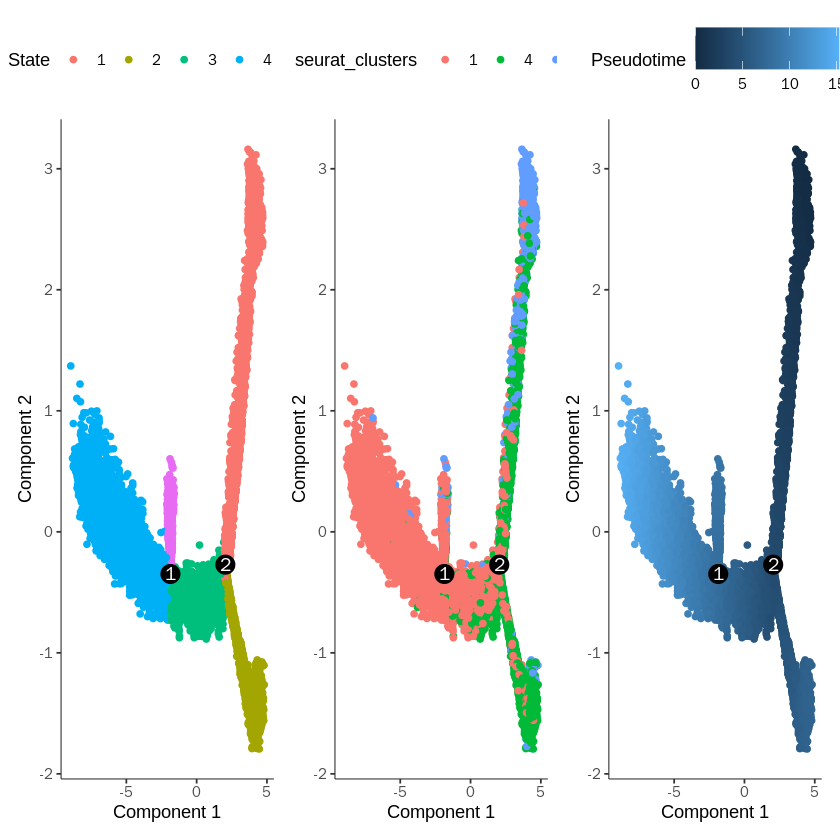

In [11]:
#State轨迹分布图
p1 <- plot_cell_trajectory(mycds, color_by = "State")
##Cluster轨迹分布图
p2 <- plot_cell_trajectory(mycds, color_by = "seurat_clusters")
##Pseudotime轨迹图
p3 <- plot_cell_trajectory(mycds, color_by = "Pseudotime")tu

p1|p2|p3

In [12]:
saveRDS(mycds, file = paste0(tmpdir, 'mycds_dp_0815.rds'))

In [ ]:
##选择用于降维排序的基因（三选一）
# 使用clusters差异表达基因######################################################

# diff.genes <- read.csv('subcluster_diff_genes_wilcox.csv')
# diff.genes <- subset(diff.genes,p_val_adj<0.01)$gene
# mycds <- setOrderingFilter(mycds, diff.genes)
# plot_ordering_genes(mycds)

#使用seurat选择的高变基因#######################################################

# var.genes <- VariableFeatures(scRNA)
# mycds <- setOrderingFilter(mycds, var.genes)
# plot_ordering_genes(mycds)


# 使用monocle选择的高变基因
disp_table <- dispersionTable(cds)
disp.genes <- subset(disp_table, mean_expression >= 0.5 & dispersion_empirical >= 1 * dispersion_fit)$gene_id
mycds <- setOrderingFilter(mycds, disp.genes)
plot_ordering_genes(mycds)

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (class(projection) != "matrix") projection <- as.matrix(projection):
“条件的长

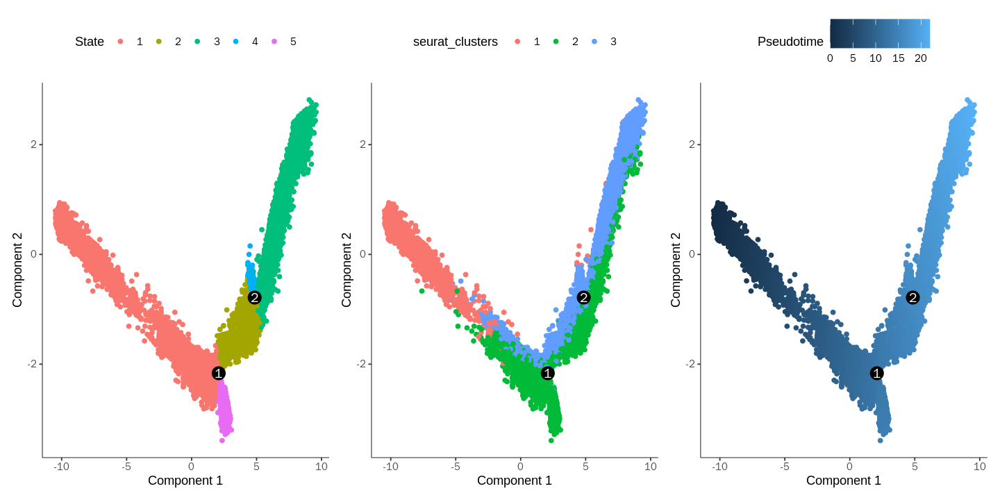

In [23]:
##降维及拟时分析
#降维
mycds <- reduceDimension(mycds, max_components = 2, method = 'DDRTree')
#排序
mycds <- orderCells(mycds)
#State轨迹分布图
p1 <- plot_cell_trajectory(mycds, color_by = "State")
##Cluster轨迹分布图
p2 <- plot_cell_trajectory(mycds, color_by = "seurat_clusters")
##Pseudotime轨迹图
p3 <- plot_cell_trajectory(mycds, color_by = "Pseudotime")

p1|p2|p3

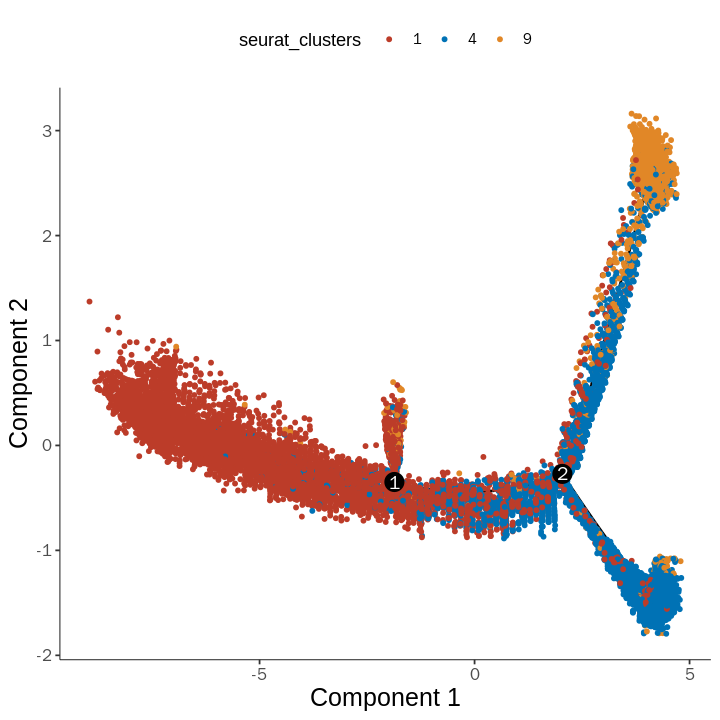

In [13]:
# 细胞分化轨迹图 & pseudotime图
cell_type_color <- unique((pData(mycds))$cell_cluster)
cols = c("#BC3C29FF" ,"#0072B5FF", "#E18727FF", "#20854EFF", "#7876B1FF", "#6F99ADFF", "#FFDC91FF", "#EE4C97FF",
         "#E64B35B2", "#4DBBD5B2", "#00A087B2", "#3C5488B2", "#F39B7FB2" ,"#8491B4B2", "#91D1C2B2", "#DC0000B2" ,"#7E6148B2",
         "#00468BFF" ,"#ED0000FF", "#42B540FF", "#0099B4FF", "#925E9FFF" ,"#FDAF91FF", "#AD002AFF" ,"#ADB6B6FF" ,"#1B1919FF")
names(cols) <- cell_type_color

options(repr.plot.width=6, repr.plot.height=6)
plot_cell_trajectory(mycds, color_by = "seurat_clusters", cell_size = 1)+
  scale_color_manual(values = cols)+ 
  theme(axis.text.x = element_text(size = 10),
        axis.text.y = element_text(size = 10),
        axis.title.x = element_text(size = 15),
        axis.title.y = element_text(size = 15))

#按各亚群分面
#options(repr.plot.width=18, repr.plot.height=6)
#plot_cell_trajectory(mycds, color_by = "seurat_clusters") + facet_wrap(~seurat_clusters, nrow = 1)
#plot_cell_trajectory(mycds, color_by = "State") + facet_wrap(~State, nrow = 1)

In [14]:
# 各阶段转录因子（或差异基因）表达热图
TFs <- disp.genes[1:3]
plot_genes_branched_heatmap(mycds[TFs,],
                            branch_point = 1,
                            num_clusters = 3,
                            cores = 4,
                            use_gene_short_name = T,
                            show_rownames = T)

ERROR: Error in eval(expr, envir, enclos): 找不到对象'disp.genes'


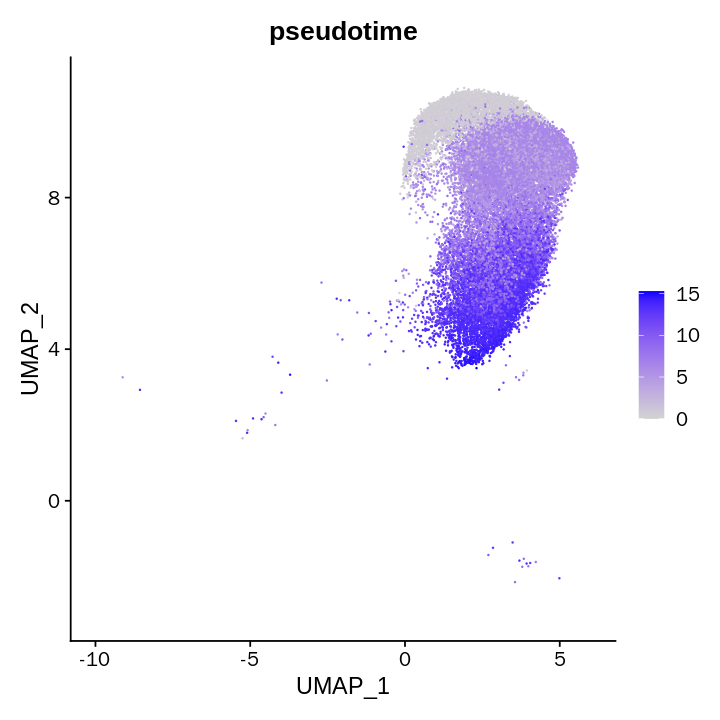

In [15]:
# 将Pseudotime导入Seurat绘图
pheno <- Biobase::pData(mycds)
sce2cds$pseudotime <- pheno$Pseudotime
options(repr.plot.width=6, repr.plot.height=6)
FeaturePlot(sce2cds, features = "pseudotime")

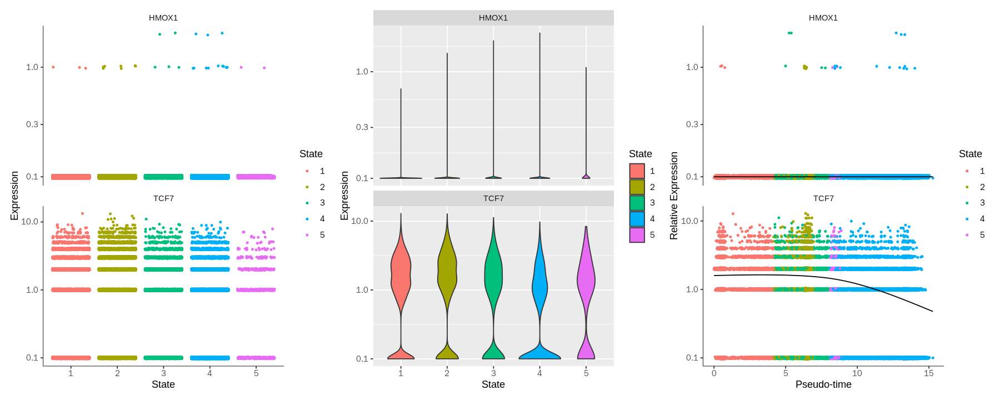

In [16]:
# Monocle识别的各state基因可视化
s.genes <- c("TCF7","HMOX1")
p1 <- plot_genes_jitter(mycds[s.genes,], grouping = "State", color_by = "State")
p2 <- plot_genes_violin(mycds[s.genes,], grouping = "State", color_by = "State")
p3 <- plot_genes_in_pseudotime(mycds[s.genes,], color_by = "State")

options(repr.plot.width=15, repr.plot.height=6)
p1|p2|p3

In [ ]:
##拟时相关基因聚类热图
#cluster差异基因
diff.genes <- FindAllMarkers(mycds, only.pos = T)
sig_diff.genes <- subset(diff.genes, p_val_adj<0.0001 & abs(avg_log2FC)>0.75)$gene
sig_diff.genes <- unique(as.character(sig_diff.genes))
diff_test <- differentialGeneTest(mycds[sig_diff.genes,], cores = 16, fullModelFormulaStr = "~sm.ns(Pseudotime)")
sig_gene_names <- row.names(subset(diff_test, qval<0.01))
plot_pseudotime_heatmap(mycds[sig_gene_names,], num_clusters=3, show_rownames=T, return_heatmap=T)

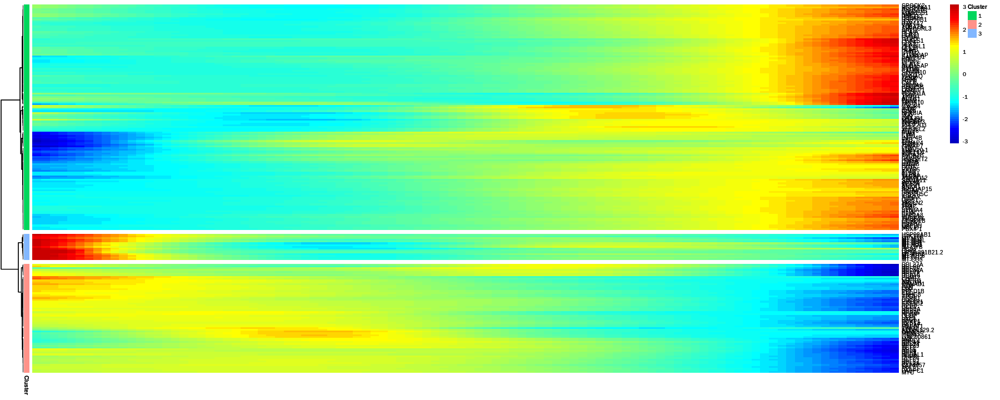

In [17]:
#高变基因
disp_table <- dispersionTable(mycds)
disp.genes <- subset(disp_table, mean_expression>=0.5 & dispersion_empirical>=1*dispersion_fit)
disp.genes <- as.character(disp.genes$gene_id)
diff_test <- differentialGeneTest(mycds[disp.genes,], cores = 16, fullModelFormulaStr = "~sm.ns(Pseudotime)")
sig_gene_names <- row.names(subset(diff_test, qval < 1e-04))
plot_pseudotime_heatmap(mycds[sig_gene_names,], num_clusters=3, show_rownames=T, return_heatmap=T)

Warning message in if (progenitor_method == "duplicate") {:
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (progenitor_method == "sequential_split") {:
“条件的长度大于一，因此只能用其第一元素”
Warning message in if (isSparseMatrix(exprs(X))) {:
“条件的长度大于一，因此只能用其第一元素”


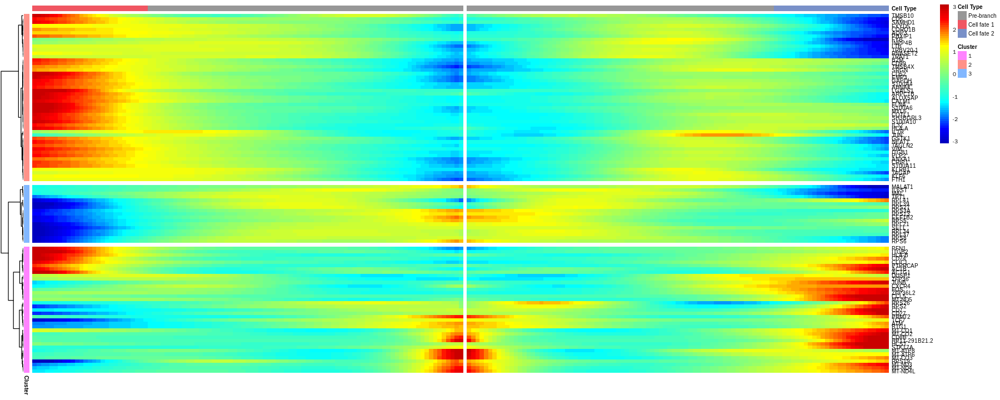

In [18]:
##细胞轨迹分支相关基因
#disp_table <- dispersionTable(mycds)
#disp.genes <- subset(disp_table, mean_expression>=0.5 & dispersion_empirical>=1*dispersion_fit)
#disp.genes <- as.character(disp.genes$gene_id)
mycds_sub <- mycds[disp.genes,]
plot_cell_trajectory(mycds_sub, color_by = "State")
beam_res <- BEAM(mycds_sub, branch_point = 1, cores = 8)
beam_res <- beam_res[order(beam_res$qval),]
beam_res <- beam_res[,c("gene_short_name", "pval", "qval")]
mycds_sub_beam <- mycds_sub[row.names(subset(beam_res, qval < 1e-4)),]
plot_genes_branched_heatmap(mycds_sub_beam, branch_point = 1, num_clusters = 3, show_rownames = T)

In [19]:
save(mycds, ordering_genes, sig_gene_names, beam_res,file = paste0(tmpdir, 'mycds.Rdata'))

# 细胞通讯

## CellphoneDB

In [8]:
packageVersion('monocle')

[1] ‘2.22.0’

In [44]:
gc()

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,4407692,235.4,907731198,48478.1,710453381,37942.4
Vcells,8628115576,65827.3,20354531644,155292.8,20354530937,155292.8


In [11]:
DefaultAssay(sce_TNK) <- "RNA"
sce_TNK

An object of class Seurat 
22831 features across 138031 samples within 2 assays 
Active assay: RNA (20831 features, 0 variable features)
 1 other assay present: RPCA
 2 dimensional reductions calculated: pca, umap